## 1 Introduction

Develop a customer segmentation model to define marketing strategy.
We are provided the data of active credit card holders during the last 6 months.  The sample data set summarizes the usage behavior of about 9000 active credit card holders during the last 6 months. The file is at a customer level with 18 behavioral variables.

EXPECTATIONS :
-	Build an ‘enriched’ customer profile by deriving “intelligent” KPIs.
-	Use the derived KPIs to gain insight on the customer profiles.
-	Identification of the relationships/ affinities between services.
-	Reveal the behavioural segments of credit card holders
-	Identify characterisitics of the customer segments using detailed profiling.
-	Provide the strategic insights and implementation of strategies for given set of customer characteristics.
    
**Submitted By : _Shriya Jain_**

## 2 Preparations

### 2.1 Importing Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.special import boxcox1p
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
from matplotlib.backends.backend_pdf import PdfPages


In [2]:
pd.options.display.max_columns = None

In [3]:
cc_data = pd.read_csv('CC GENERAL.csv')
cc_data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
cc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
CUST_ID                             8950 non-null object
BALANCE                             8950 non-null float64
BALANCE_FREQUENCY                   8950 non-null float64
PURCHASES                           8950 non-null float64
ONEOFF_PURCHASES                    8950 non-null float64
INSTALLMENTS_PURCHASES              8950 non-null float64
CASH_ADVANCE                        8950 non-null float64
PURCHASES_FREQUENCY                 8950 non-null float64
ONEOFF_PURCHASES_FREQUENCY          8950 non-null float64
PURCHASES_INSTALLMENTS_FREQUENCY    8950 non-null float64
CASH_ADVANCE_FREQUENCY              8950 non-null float64
CASH_ADVANCE_TRX                    8950 non-null int64
PURCHASES_TRX                       8950 non-null int64
CREDIT_LIMIT                        8949 non-null float64
PAYMENTS                            8950 non-null float64
MINIMUM_PAYMENTS            

In [5]:
cc_data.nunique()

CUST_ID                             8950
BALANCE                             8871
BALANCE_FREQUENCY                     43
PURCHASES                           6203
ONEOFF_PURCHASES                    4014
INSTALLMENTS_PURCHASES              4452
CASH_ADVANCE                        4323
PURCHASES_FREQUENCY                   47
ONEOFF_PURCHASES_FREQUENCY            47
PURCHASES_INSTALLMENTS_FREQUENCY      47
CASH_ADVANCE_FREQUENCY                54
CASH_ADVANCE_TRX                      65
PURCHASES_TRX                        173
CREDIT_LIMIT                         205
PAYMENTS                            8711
MINIMUM_PAYMENTS                    8636
PRC_FULL_PAYMENT                      47
TENURE                                 7
dtype: int64

In [6]:
# CUST_ID is unique identifier so it wont play any role in clustering
features1 = cc_data.columns.difference(['CUST_ID'])

### 2.2 Data Summary

In [7]:
# Summary for continuous variables
def cont_var_summary(col):
    return(pd.Series([col.count(),col.isnull().sum(),col.sum(),col.mean(),col.median(),col.std(),col.var(),col.min(),col.dropna().quantile(0.01), col.dropna().quantile(0.05),col.dropna().quantile(0.10),col.dropna().quantile(0.25),col.dropna().quantile(0.50),col.dropna().quantile(0.75), col.dropna().quantile(0.90),col.dropna().quantile(0.95), col.dropna().quantile(0.99),col.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX']))

In [8]:
np.round(cc_data[features1].apply(lambda x : cont_var_summary(x)),2)

,BALANCE,BALANCE_FREQUENCY,CASH_ADVANCE,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,CREDIT_LIMIT,INSTALLMENTS_PURCHASES,MINIMUM_PAYMENTS,ONEOFF_PURCHASES,ONEOFF_PURCHASES_FREQUENCY,PAYMENTS,PRC_FULL_PAYMENT,PURCHASES,PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,PURCHASES_TRX,TENURE
N,8950.00,8950.00,8950.00,8950.00,8950.00,8949.00,8950.00,8637.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00
NMISS,0.00,0.00,0.00,0.00,0.00,1.00,0.00,313.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
SUM,14002049.71,7851.57,8760896.46,1209.54,29077.00,40220828.13,3679055.42,7464151.91,5302314.47,1812.00,15511637.48,1375.75,8978683.26,4388.64,3261.71,131653.00,103080.00
MEAN,1564.47,0.88,978.87,0.14,3.25,4494.45,411.07,864.21,592.44,0.20,1733.14,0.15,1003.20,0.49,0.36,14.71,11.52
MEDIAN,873.39,1.00,0.00,0.00,0.00,3000.00,89.00,312.34,38.00,0.08,856.90,0.00,361.28,0.50,0.17,7.00,12.00
STD,2081.53,0.24,2097.16,0.20,6.82,3638.82,904.34,2372.45,1659.89,0.30,2895.06,0.29,2136.63,0.40,0.40,24.86,1.34
VAR,4332774.97,0.06,4398096.33,0.04,46.58,13240979.88,817827.43,5628502.90,2755227.90,0.09,8381394.16,0.09,4565208.19,0.16,0.16,617.90,1.79
MIN,0.00,0.00,0.00,0.00,0.00,50.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.00
P1,0.07,0.09,0.00,0.00,0.00,500.00,0.00,19.52,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.00
P5,8.81,0.27,0.00,0.00,0.00,1000.00,0.00,73.28,0.00,0.00,89.99,0.00,0.00,0.00,0.00,0.00,8.00


### 2.3 Missing Value Treatment

In [9]:
# Calculating null values percentage
cont_var_null_count = cc_data[features1].isna().sum() 
cont_var_null_pct= (cont_var_null_count[cont_var_null_count>0]/cc_data[features1].shape[0]) * 100
cont_var_null_pct.sort_values()

CREDIT_LIMIT        0.011173
MINIMUM_PAYMENTS    3.497207
dtype: float64

C:\Users\Shriya\Software\Anaconda2\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


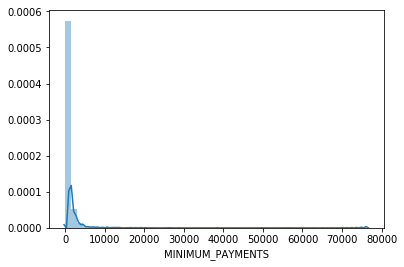

In [10]:
sns.distplot(cc_data['MINIMUM_PAYMENTS'][cc_data['MINIMUM_PAYMENTS'].notnull()])

In [11]:
#Skewed data hence imputing median
cc_data['MINIMUM_PAYMENTS'].fillna(cc_data['MINIMUM_PAYMENTS'].median(),inplace=True)

In [12]:
cont_var_null_count = cc_data[features1].isna().sum() 
cont_var_null_pct= (cont_var_null_count[cont_var_null_count>0]/cc_data[features1].shape[0]) * 100
cont_var_null_pct.sort_values()

CREDIT_LIMIT    0.011173
dtype: float64

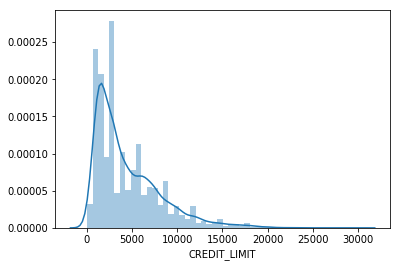

In [13]:
sns.distplot(cc_data['CREDIT_LIMIT'][cc_data['CREDIT_LIMIT'].notnull()])

In [14]:
# skewed data hence imputing median
cc_data['CREDIT_LIMIT'].fillna(cc_data['CREDIT_LIMIT'].median(),inplace=True)

In [15]:
cont_var_null_count = cc_data[features1].isna().sum() 
cont_var_null_pct= (cont_var_null_count[cont_var_null_count>0]/cc_data[features1].shape[0]) * 100
cont_var_null_pct.sort_values()

Series([], dtype: float64)

### 2.4 Deriving New KPI

In [16]:
var_used = []

#### 2.4.1 Monthly Average Purchase

In [17]:
cc_data['MONTHLY_AVG_PURCHASE'] = cc_data['PURCHASES'] / cc_data['TENURE']
var_used.extend(['PURCHASES','TENURE'])
cc_data['MONTHLY_AVG_PURCHASE'].head(5)

0      7.950000
1      0.000000
2     64.430833
3    124.916667
4      1.333333
Name: MONTHLY_AVG_PURCHASE, dtype: float64

#### 2.4.2 Cash Advance Amount

In [18]:
cc_data['MONTHLY_CASH_ADVANCE'] = cc_data['CASH_ADVANCE'] / cc_data['TENURE']
var_used.extend(['CASH_ADVANCE'])
cc_data['MONTHLY_CASH_ADVANCE'].head(5)

0      0.000000
1    536.912124
2      0.000000
3     17.149001
4      0.000000
Name: MONTHLY_CASH_ADVANCE, dtype: float64

#### 2.4.3 Purchases by type

In [19]:
cc_data[['ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES']].head()

,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES
0,0.00,95.4
1,0.00,0.0
2,773.17,0.0
3,1499.00,0.0
4,16.00,0.0


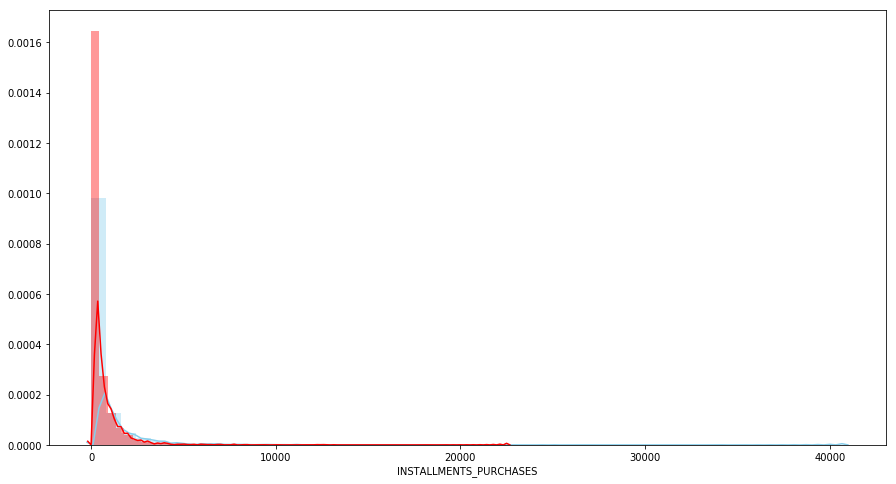

In [20]:
plt.figure(figsize=(15,8))
sns.distplot(cc_data['ONEOFF_PURCHASES'],color='skyblue')
sns.distplot(cc_data['INSTALLMENTS_PURCHASES'],color='red')

In [21]:
cc_data[(cc_data['ONEOFF_PURCHASES'] == 0) & (cc_data['INSTALLMENTS_PURCHASES'] == 0) ].shape

(2042, 20)

In [22]:
cc_data[(cc_data['ONEOFF_PURCHASES'] > 0) & (cc_data['INSTALLMENTS_PURCHASES'] > 0) ].shape

(2774, 20)

In [23]:
cc_data[(cc_data['ONEOFF_PURCHASES'] == 0) & (cc_data['INSTALLMENTS_PURCHASES'] > 0) ].shape

(2260, 20)

In [24]:
cc_data[(cc_data['ONEOFF_PURCHASES'] > 0) & (cc_data['INSTALLMENTS_PURCHASES'] == 0) ].shape

(1874, 20)

In [25]:
def purchase_type(row):
    if (row['ONEOFF_PURCHASES'] == 0) & (row['INSTALLMENTS_PURCHASES'] == 0):
        return('none')
    elif (row['ONEOFF_PURCHASES'] > 0) & (row['INSTALLMENTS_PURCHASES'] > 0):
        return('both')
    elif (row['ONEOFF_PURCHASES'] > 0) & (row['INSTALLMENTS_PURCHASES'] == 0):
        return('oneoff')
    elif (row['ONEOFF_PURCHASES'] == 0) & (row['INSTALLMENTS_PURCHASES'] > 0):
        return('installments')


In [26]:
cc_data['PURCHASE_TYPE'] = cc_data.apply(purchase_type,axis=1)
var_used.extend(['ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES'])
cc_data['PURCHASE_TYPE'].value_counts()

both            2774
installments    2260
none            2042
oneoff          1874
Name: PURCHASE_TYPE, dtype: int64

#### 2.4.4 Average Amount Per Purchase and Cash Advance Transaction

    - Average Amount Per Purchase = AVERAGE_PURCHASE_TRX
    - Average Amount Per Cash Advance Transaction =
      AVERAGE_CASH_ADVANCE_TRX

In [27]:
print((cc_data['PURCHASES_TRX'] == 0).sum())
print((cc_data['CASH_ADVANCE_TRX'] == 0).sum())

2044
4628


In [28]:
cc_data['AVERAGE_PURCHASE_TRX'] = cc_data.apply(lambda x : x['PURCHASES']/x['PURCHASES_TRX'] if x['PURCHASES_TRX'] !=0 else 0,axis=1)
cc_data['AVERAGE_CASH_ADVANCE_TRX'] = cc_data.apply(lambda x : x['CASH_ADVANCE']/x['CASH_ADVANCE_TRX'] if x['CASH_ADVANCE_TRX'] !=0 else 0,axis=1)

#### 2.4.5 Limit Usage

In [29]:
cc_data['LIMIT_USAGE'] = cc_data.apply(lambda x : x['BALANCE']/x['CREDIT_LIMIT'],axis=1)
var_used.extend(['BALANCE','CREDIT_LIMIT'])
cc_data['LIMIT_USAGE'].head()

0    0.040901
1    0.457495
2    0.332687
3    0.222223
4    0.681429
Name: LIMIT_USAGE, dtype: float64

#### 2.4.6 Payments to minimum payments ratio

In [30]:
cc_data['PAY_MIN_PAY'] = cc_data.apply(lambda x : x['PAYMENTS']/x['MINIMUM_PAYMENTS'],axis=1)
var_used.extend(['PAYMENTS','MINIMUM_PAYMENTS'])
cc_data['PAY_MIN_PAY'].head()

0    1.446508
1    3.826241
2    0.991682
3    0.000000
4    2.771075
Name: PAY_MIN_PAY, dtype: float64

In [31]:
var_used

['PURCHASES',
 'TENURE',
 'CASH_ADVANCE',
 'ONEOFF_PURCHASES',
 'INSTALLMENTS_PURCHASES',
 'BALANCE',
 'CREDIT_LIMIT',
 'PAYMENTS',
 'MINIMUM_PAYMENTS']

## 3. Visualize Feature Distribution

In [32]:
features2 = cc_data.columns.difference(['CUST_ID','PURCHASE_TYPE']+var_used)

### 3.1 Scatter Matrix

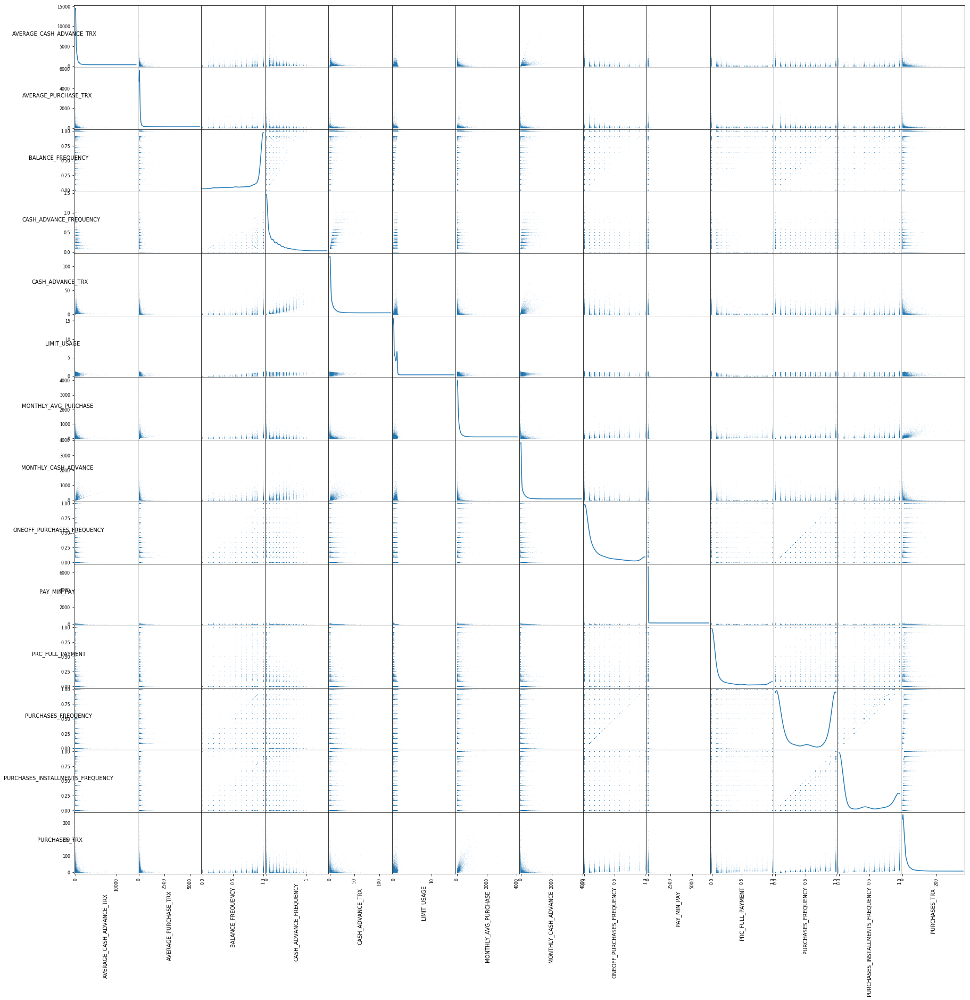

In [33]:

scatter_matrix = pd.plotting.scatter_matrix(
    cc_data[features2],
    figsize  = [30, 30],
    marker   = ".",
    s        = 0.8,
    diagonal = "kde"
)

for ax in scatter_matrix.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize = 10, rotation = 90)
    ax.set_ylabel(ax.get_ylabel(), fontsize = 10, rotation = 0)

The distribution of all the features appears to be similar. It is strongly right skewed, in that most of the data points fall in then first few intervals


### 3.2 Tukey's Method for identifying outliers

In [34]:
Q1 = cc_data[features2].quantile(0.25)
Q3 = cc_data[features2].quantile(0.75)
IQR = Q3 - Q1
((cc_data[features2] < (Q1 - 1.5 * IQR)) |(cc_data[features2] > (Q3 + 1.5 * IQR))).sum(axis=0).sort_values(ascending=False)


BALANCE_FREQUENCY                   1493
PRC_FULL_PAYMENT                    1474
MONTHLY_CASH_ADVANCE                1027
PAY_MIN_PAY                          813
CASH_ADVANCE_TRX                     804
AVERAGE_CASH_ADVANCE_TRX             793
MONTHLY_AVG_PURCHASE                 785
ONEOFF_PURCHASES_FREQUENCY           782
PURCHASES_TRX                        766
AVERAGE_PURCHASE_TRX                 652
CASH_ADVANCE_FREQUENCY               525
LIMIT_USAGE                            3
PURCHASES_INSTALLMENTS_FREQUENCY       0
PURCHASES_FREQUENCY                    0
dtype: int64

In [35]:
no_outlier_col = []
no_outlier_col.extend(['PURCHASES_INSTALLMENTS_FREQUENCY','PURCHASES_FREQUENCY'])

Judging by the Tukey's Method for Identifying outliers, we can see that there are lot of outliers in each of the distributions. This conforms with the fact that there’s a significant different between the mean and the median of the feature distributions.

## 4. Data Preprocessing

### 4.1 Feature Scaling

In [36]:
lambda_dict = {}
lambda_dict['already'] = ['PURCHASES_INSTALLMENTS_FREQUENCY','PURCHASES_FREQUENCY']

Using **boxcox1p**
<br> because most of the data is right skewed and many values are zero
<br> lambda is checked from 0 to -5

In [37]:
box_cox_df = pd.DataFrame()

lambda_ = 0

for col in list(set(features2.tolist()) - set(no_outlier_col)):
    box_cox_df[col] = boxcox1p(cc_data[col],[lambda_])
    
Q1 = box_cox_df.quantile(0.25)
Q3 = box_cox_df.quantile(0.75)
IQR = Q3 - Q1
series = ((box_cox_df < (Q1 - 1.5 * IQR)) |(box_cox_df > (Q3 + 1.5 * IQR))).sum(axis=0).sort_values()

lambda_dict[lambda_] = series[series==0].index.tolist()
no_outlier_col.extend(lambda_dict[lambda_])

In [38]:
box_cox_df = pd.DataFrame()

lambda_ = -1

for col in list(set(features2.tolist()) - set(no_outlier_col)):
    box_cox_df[col] = boxcox1p(cc_data[col],[lambda_])
    
Q1 = box_cox_df.quantile(0.25)
Q3 = box_cox_df.quantile(0.75)
IQR = Q3 - Q1
series = ((box_cox_df < (Q1 - 1.5 * IQR)) |(box_cox_df > (Q3 + 1.5 * IQR))).sum(axis=0).sort_values()

lambda_dict[lambda_] = series[series==0].index.tolist()
no_outlier_col.extend(lambda_dict[lambda_])

In [39]:
box_cox_df = pd.DataFrame()

lambda_ = -2

for col in list(set(features2.tolist()) - set(no_outlier_col)):
    box_cox_df[col] = boxcox1p(cc_data[col],[lambda_])
    
Q1 = box_cox_df.quantile(0.25)
Q3 = box_cox_df.quantile(0.75)
IQR = Q3 - Q1
series = ((box_cox_df < (Q1 - 1.5 * IQR)) |(box_cox_df > (Q3 + 1.5 * IQR))).sum(axis=0).sort_values()

lambda_dict[lambda_] = series[series==0].index.tolist()
no_outlier_col.extend(lambda_dict[lambda_])

In [40]:
box_cox_df = pd.DataFrame()

lambda_ = -3

for col in list(set(features2.tolist()) - set(no_outlier_col)):
    box_cox_df[col] = boxcox1p(cc_data[col],[lambda_])
    
Q1 = box_cox_df.quantile(0.25)
Q3 = box_cox_df.quantile(0.75)
IQR = Q3 - Q1
series = ((box_cox_df < (Q1 - 1.5 * IQR)) |(box_cox_df > (Q3 + 1.5 * IQR))).sum(axis=0).sort_values()

lambda_dict[lambda_] = series[series==0].index.tolist()
no_outlier_col.extend(lambda_dict[lambda_])

In [41]:
box_cox_df = pd.DataFrame()

lambda_ = -4

for col in list(set(features2.tolist()) - set(no_outlier_col)):
    box_cox_df[col] = boxcox1p(cc_data[col],[lambda_])
    
Q1 = box_cox_df.quantile(0.25)
Q3 = box_cox_df.quantile(0.75)
IQR = Q3 - Q1
series = ((box_cox_df < (Q1 - 1.5 * IQR)) |(box_cox_df > (Q3 + 1.5 * IQR))).sum(axis=0).sort_values()

lambda_dict[lambda_] = series[series==0].index.tolist()
no_outlier_col.extend(lambda_dict[lambda_])

In [42]:
box_cox_df = pd.DataFrame()

lambda_ = -5

for col in list(set(features2.tolist()) - set(no_outlier_col)):
    box_cox_df[col] = boxcox1p(cc_data[col],[lambda_])
    
Q1 = box_cox_df.quantile(0.25)
Q3 = box_cox_df.quantile(0.75)
IQR = Q3 - Q1
series = ((box_cox_df < (Q1 - 1.5 * IQR)) |(box_cox_df > (Q3 + 1.5 * IQR))).sum(axis=0).sort_values()

lambda_dict[lambda_] = series[series==0].index.tolist()
no_outlier_col.extend(lambda_dict[lambda_])

In [43]:
lambda_dict

{-5: [],
 -4: ['PRC_FULL_PAYMENT'],
 -3: ['CASH_ADVANCE_FREQUENCY'],
 -2: [],
 -1: ['LIMIT_USAGE',
  'ONEOFF_PURCHASES_FREQUENCY',
  'CASH_ADVANCE_TRX',
  'PAY_MIN_PAY'],
 0: ['MONTHLY_CASH_ADVANCE',
  'MONTHLY_AVG_PURCHASE',
  'PURCHASES_TRX',
  'AVERAGE_CASH_ADVANCE_TRX'],
 'already': ['PURCHASES_INSTALLMENTS_FREQUENCY', 'PURCHASES_FREQUENCY']}

In [44]:
box_scaled = pd.DataFrame()

for k,v in lambda_dict.items():
    if k != 'already':
        for col in v:
            box_scaled[col] = boxcox1p(cc_data[col],[k])

In [45]:
box_scaled.shape

(8950, 10)

In [46]:
box_scaled = pd.concat([box_scaled,cc_data[[col for col in features2 if col not in box_scaled.columns]]],axis=1)

In [47]:
box_scaled.shape

(8950, 14)

In [48]:
set(features2)- set(no_outlier_col)

{'AVERAGE_PURCHASE_TRX', 'BALANCE_FREQUENCY'}

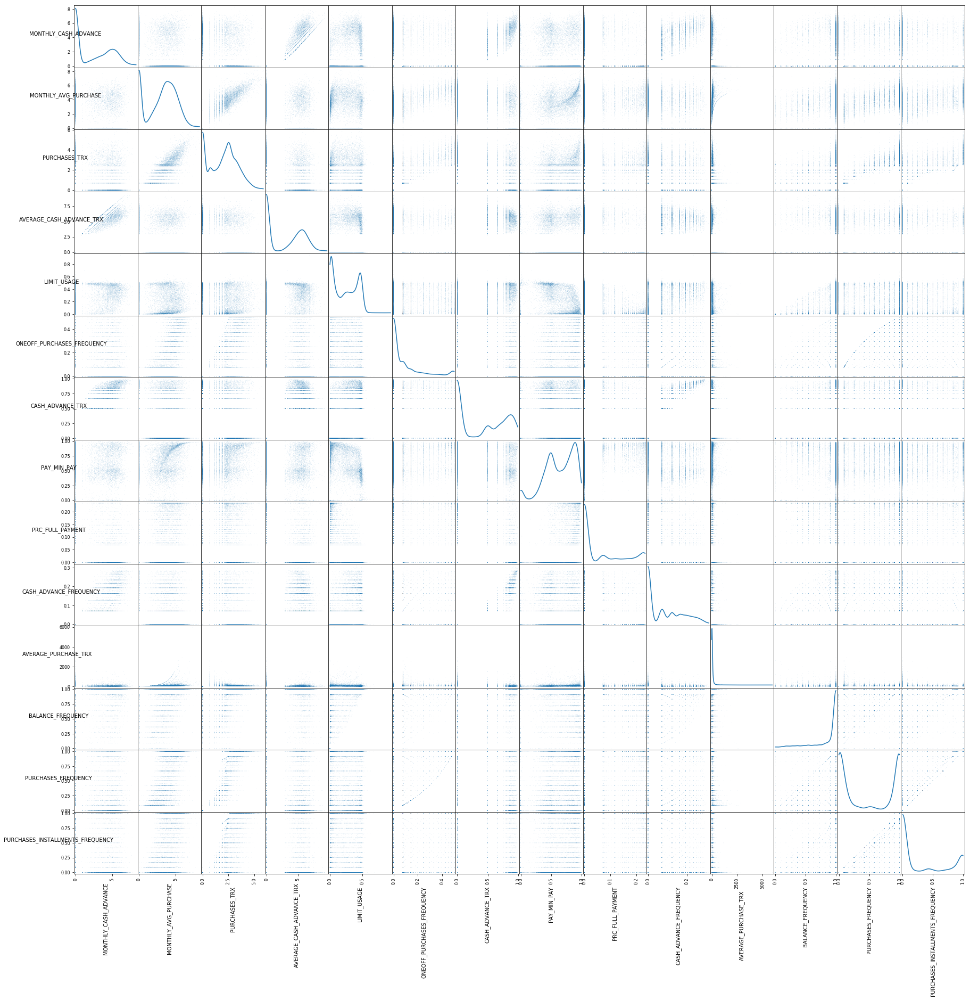

In [49]:
# Produce a scatter matrix for each pair of newly-transformed features
scatter_matrix = pd.plotting.scatter_matrix(
    box_scaled,
    figsize  = [30, 30],
    marker   = ".",
    s        = 0.8,
    diagonal = "kde"
)

for ax in scatter_matrix.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize = 10, rotation = 90)
    ax.set_ylabel(ax.get_ylabel(), fontsize = 10, rotation = 0)

In [50]:
box_scaled.isna().any().sum()

0

### 4.2 Insights from new KPIs

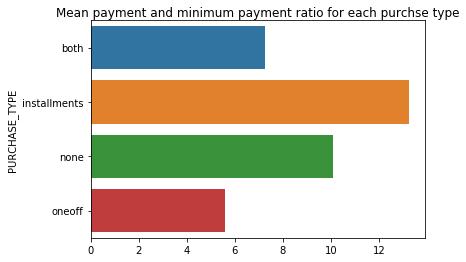

In [51]:
# Average payment and minimum payment ratio for each purchse type.

ratio=cc_data.groupby('PURCHASE_TYPE').apply(lambda x: np.mean(x['PAY_MIN_PAY']))
sns.barplot(x=ratio,y=ratio.index)
plt.title('Mean payment and minimum payment ratio for each purchse type')

1) customers with installment purchases are paying dues

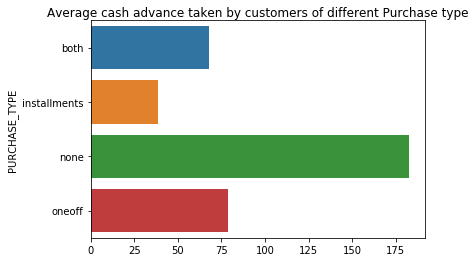

In [52]:
# Average cash advance taken by customers of different Purchase type

mca = cc_data.groupby('PURCHASE_TYPE').apply(lambda x : np.mean(x['MONTHLY_CASH_ADVANCE']))
sns.barplot(x=mca,y = mca.index)
plt.title('Average cash advance taken by customers of different Purchase type')

2) Customers who don't do one-off and installment purchases take more cash on advance

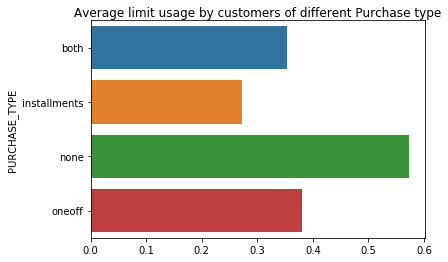

In [53]:
lu = cc_data.groupby('PURCHASE_TYPE').apply(lambda x: np.mean(x['LIMIT_USAGE']))
sns.barplot(x=lu,y = lu.index)
plt.title('Average limit usage by customers of different Purchase type')

3) Customers with installment purchases have good credit score

In [54]:
def create_dummies(df,col):
    df_dum = pd.get_dummies(df[col],prefix=col)
    df = pd.concat([df,df_dum],axis=1)
    df.drop(columns=[col],inplace=True,axis=1)
    return(df)

In [55]:
cc_data2 = pd.concat([box_scaled,cc_data['PURCHASE_TYPE']],axis=1)
cc_data2['PURCHASE_TYPE'] = cc_data2['PURCHASE_TYPE'].astype('category')
cc_data2 = create_dummies(cc_data2,'PURCHASE_TYPE')
cc_data2.shape

(8950, 18)

In [56]:
sorted(cc_data2.columns)

['AVERAGE_CASH_ADVANCE_TRX',
 'AVERAGE_PURCHASE_TRX',
 'BALANCE_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'CASH_ADVANCE_TRX',
 'LIMIT_USAGE',
 'MONTHLY_AVG_PURCHASE',
 'MONTHLY_CASH_ADVANCE',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PAY_MIN_PAY',
 'PRC_FULL_PAYMENT',
 'PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'PURCHASES_TRX',
 'PURCHASE_TYPE_both',
 'PURCHASE_TYPE_installments',
 'PURCHASE_TYPE_none',
 'PURCHASE_TYPE_oneoff']

### 4.3 Checking correlation

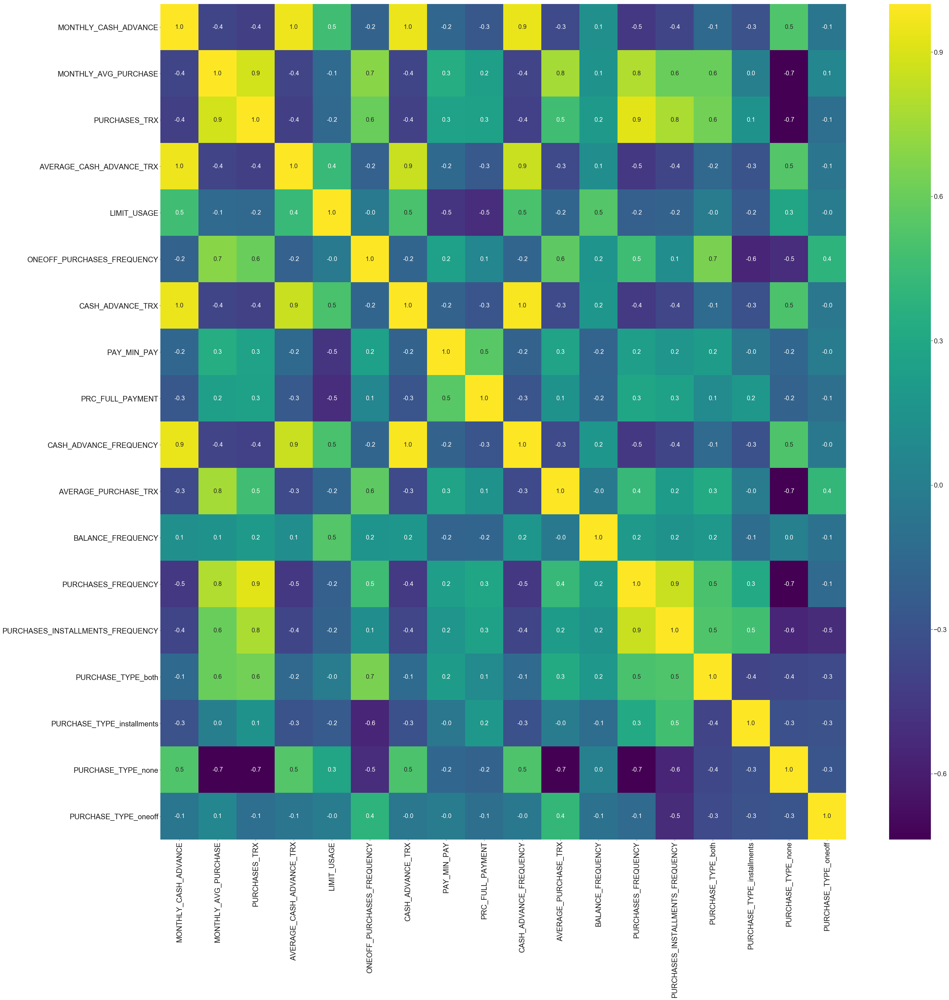

In [57]:
plt.subplots(figsize=(50,50))
sns.set(font_scale=2)
sns.heatmap(cc_data2.corr(method='spearman'),cmap='viridis', fmt=".1f",annot=True,annot_kws={"size":20})

    - Heatmap shows many of the variables are correlated
    - Scaling the variables to have equal weights 
    - Then applying PCA

### 4.4 Scaling data

In [58]:

ss = StandardScaler()
cc_data2_scaled = ss.fit_transform(cc_data2.astype(float))

### 4.5 Applying PCA

In [59]:
cc_data2_scaled.shape[1]

18L

In [60]:
pc = PCA(n_components=cc_data2_scaled.shape[1])
cc2s_pca=pc.fit(cc_data2_scaled)
var = cc2s_pca.explained_variance_ratio_
var

array([3.78560232e-01, 1.66437556e-01, 1.17507902e-01, 8.77830109e-02,
       6.63371903e-02, 4.74501072e-02, 4.34224274e-02, 2.57535703e-02,
       1.63080990e-02, 1.54828631e-02, 1.25818973e-02, 1.06258502e-02,
       4.55070362e-03, 2.39231522e-03, 2.01504645e-03, 1.83570169e-03,
       9.55527017e-04, 3.22467635e-33])

In [61]:
#cumulative variance
cum_var = np.cumsum(np.round(var,decimals=4)*100)
cum_var

array([ 37.86,  54.5 ,  66.25,  75.03,  81.66,  86.41,  90.75,  93.33,
        94.96,  96.51,  97.77,  98.83,  99.29,  99.53,  99.73,  99.91,
       100.01, 100.01])

In [62]:
i, = np.where(cum_var > 87)
i

array([ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17], dtype=int64)

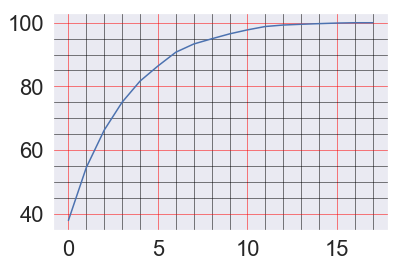

In [63]:
fig, ax = plt.subplots()
pd.Series(cum_var).plot(ax=ax)
# Don't allow the axis to be on top of your data
ax.set_axisbelow(True)

# Turn on the minor TICKS, which are required for the minor GRID
ax.minorticks_on()

# Customize the major grid
ax.grid(which='major', linestyle='-', linewidth='0.5', color='red')
# Customize the minor grid
ax.grid(which='minor', linestyle='-', linewidth='0.5', color='black')


Since 5 components explaining around 89% of variance so selecting 5 components

In [64]:
cc2s_final = PCA(n_components=5).fit(cc_data2_scaled)
cc2s_final_pcs = cc2s_final.fit_transform(cc_data2_scaled)
cc2s_final_pcs.shape

(8950L, 5L)

In [65]:
cc3_pcs = pd.DataFrame(cc2s_final_pcs)
col_list = cc_data2.columns

In [66]:
Loadings = pd.DataFrame(cc2s_final.components_.T, columns=['PC_' +str(i) for i in range(cc3_pcs.shape[1])],index=col_list)
Loadings.to_csv('Loadings.csv')
Loadings

,PC_0,PC_1,PC_2,PC_3,PC_4
MONTHLY_CASH_ADVANCE,-0.302453,0.266943,-0.057758,-0.152387,0.254533
MONTHLY_AVG_PURCHASE,0.318136,0.229330,0.132362,0.044642,0.217236
PURCHASES_TRX,0.321662,0.269458,-0.051011,0.038807,0.084785
AVERAGE_CASH_ADVANCE_TRX,-0.304087,0.244359,-0.055139,-0.144830,0.207729
LIMIT_USAGE,-0.196030,0.281266,-0.017208,0.418064,-0.057313
ONEOFF_PURCHASES_FREQUENCY,0.182773,0.318651,0.346238,-0.099051,-0.164197
CASH_ADVANCE_TRX,-0.309126,0.274143,-0.056442,-0.117488,0.220901
PAY_MIN_PAY,0.133686,0.020332,0.059871,-0.584199,0.101487
PRC_FULL_PAYMENT,0.173675,-0.105990,-0.092231,-0.489932,0.133958
CASH_ADVANCE_FREQUENCY,-0.287602,0.276017,-0.051428,-0.116506,0.242204


## 5. Model Building

### 5.1 Elbow Method
    To determine number of clusters

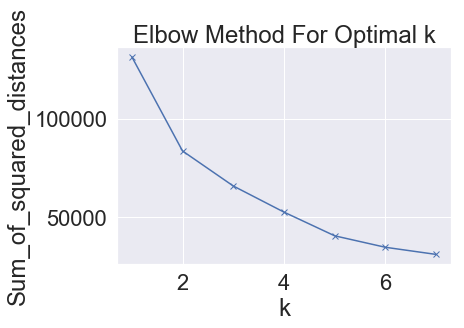

In [67]:
#Usng elbow method to determine number of clusters
Sum_of_squared_distances = []

for count in range(1,8):
    km = KMeans(n_clusters=count,random_state=250)
    km = km.fit(cc3_pcs)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(range(1,8), Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

Number of clusters should be 4 according to elbow method

In [68]:
Sum_of_squared_distances

[131558.43110979785,
 83577.0024683654,
 65748.60966068323,
 52435.71756497693,
 40359.49829899388,
 34521.29781237445,
 30889.973597975546]

### 5.2 Silhouette Method

[0.3488267362815302, 0.3514324112849022, 0.35592971820218655, 0.4097400766027807, 0.4282991898642502, 0.4460996347738153]


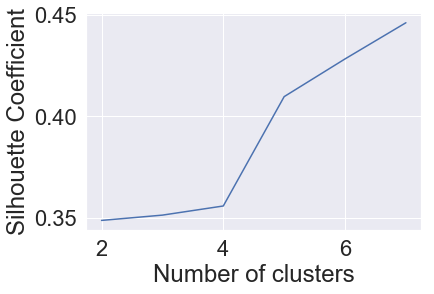

In [69]:
k_range = range(2,8)
scores = []
for k in k_range:
    km = KMeans(n_clusters=k,random_state=250)
    km.fit(cc3_pcs)
    scores.append(metrics.silhouette_score(cc3_pcs,km.labels_))
    
print(scores)
plt.plot(k_range, scores)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.grid(True)

According to silhouette coefficient number of clusters should be 4 or 6

### 5.3 Clustering with different number of clusters

In [70]:
def createClusterRange(cluster_count,df_pc_scaled,df_scaled):
    ls_cluster_objs = []
    for count in cluster_count:
        var_name = 'cluster_'+str(count)
        km_count = KMeans(n_clusters=count,random_state=250).fit(df_pc_scaled)
        df_scaled[var_name] = km_count.labels_    

In [71]:
sorted(cc_data2.columns)

['AVERAGE_CASH_ADVANCE_TRX',
 'AVERAGE_PURCHASE_TRX',
 'BALANCE_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'CASH_ADVANCE_TRX',
 'LIMIT_USAGE',
 'MONTHLY_AVG_PURCHASE',
 'MONTHLY_CASH_ADVANCE',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PAY_MIN_PAY',
 'PRC_FULL_PAYMENT',
 'PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'PURCHASES_TRX',
 'PURCHASE_TYPE_both',
 'PURCHASE_TYPE_installments',
 'PURCHASE_TYPE_none',
 'PURCHASE_TYPE_oneoff']

In [72]:
# identifying each customer based on different cluster count
createClusterRange([4,6],cc3_pcs,cc_data2)
cc_data2.head(2)

,MONTHLY_CASH_ADVANCE,MONTHLY_AVG_PURCHASE,PURCHASES_TRX,AVERAGE_CASH_ADVANCE_TRX,LIMIT_USAGE,ONEOFF_PURCHASES_FREQUENCY,CASH_ADVANCE_TRX,PAY_MIN_PAY,PRC_FULL_PAYMENT,CASH_ADVANCE_FREQUENCY,AVERAGE_PURCHASE_TRX,BALANCE_FREQUENCY,PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,PURCHASE_TYPE_both,PURCHASE_TYPE_installments,PURCHASE_TYPE_none,PURCHASE_TYPE_oneoff,cluster_4,cluster_6
0,0.000000,2.191654,1.098612,0.000000,0.039294,0.0,0.0,0.591254,0.000000,0.000000,47.7,0.818182,0.166667,0.083333,0,1,0,0,0,1
1,6.287695,0.000000,0.000000,7.385067,0.313891,0.0,0.8,0.792799,0.137969,0.162667,0.0,0.909091,0.000000,0.000000,0,0,1,0,3,4


In [73]:
# identifying size and percentage of each segment based on number of customer present in that particular segment
def cluster_size_pct(df,var_prefix,cluster_count):
    var1_name = var_prefix+str(cluster_count[0])
    size = pd.DataFrame(pd.Series(df[var1_name].size))
    for count in cluster_count:
        var_name = var_prefix+str(count)
        size = pd.concat([size,pd.Series.sort_index(df[var_name].value_counts())])
    size.columns = ['seg_size']
    pct = pd.DataFrame(size/df[var1_name].size)
    pct.columns = ['seg_pct']
    return(size.T,pct.T)

In [74]:
size,pct = cluster_size_pct(cc_data2,'cluster_',[4,6])

In [75]:
# Calculates mean for each segment as well as overall mean for each feature
def profiling(prefix,cluster_count,df_scaled_clustered):
    profiling_op = pd.DataFrame([df_scaled_clustered.apply(lambda x : x.mean())]).T
    profiling_op.columns = ['overall']
    
    for count in cluster_count:
        col_name = prefix+str(count)
        temp = df_scaled_clustered.groupby(col_name).apply(lambda x: x.mean()).T.add_prefix(col_name+'_')
        profiling_op = pd.concat([profiling_op,temp],axis=1)
    return(profiling_op)


In [76]:
profiling_op = profiling('cluster_',[4,6],cc_data2)
profiling_op

,overall,cluster_4_0,cluster_4_1,cluster_4_2,cluster_4_3,cluster_6_0,cluster_6_1,cluster_6_2,cluster_6_3,cluster_6_4,cluster_6_5
MONTHLY_CASH_ADVANCE,2.163970,0.039725,4.640984,0.166675,4.474706,4.540676,0.055264,0.076097,4.629049,4.472378,0.028671
MONTHLY_AVG_PURCHASE,3.050877,3.325363,3.907504,4.853762,0.018448,3.320521,3.357638,4.872957,4.351836,0.038918,3.550546
PURCHASES_TRX,1.894731,1.971236,2.340392,3.217184,0.013915,1.524677,2.292039,3.255227,2.923381,0.023652,1.628460
AVERAGE_CASH_ADVANCE_TRX,2.648058,0.073787,5.503525,0.296999,5.523660,5.466868,0.095530,0.146012,5.521411,5.511791,0.064228
LIMIT_USAGE,0.233454,0.121978,0.344890,0.171027,0.330274,0.329119,0.108756,0.167320,0.346436,0.332344,0.156899
ONEOFF_PURCHASES_FREQUENCY,0.128344,0.048111,0.175677,0.310550,0.000858,0.185013,0.000084,0.289406,0.181886,0.000000,0.217519
CASH_ADVANCE_TRX,0.366916,0.008964,0.784224,0.034002,0.752689,0.772857,0.011041,0.016825,0.780074,0.753556,0.008251
PAY_MIN_PAY,0.643626,0.634940,0.603109,0.764651,0.572707,0.595978,0.641179,0.767392,0.619244,0.572020,0.646330
PRC_FULL_PAYMENT,0.054746,0.077699,0.023417,0.088081,0.022421,0.025450,0.100588,0.088982,0.024647,0.022076,0.042184
CASH_ADVANCE_FREQUENCY,0.074261,0.001275,0.162187,0.005125,0.151368,0.159720,0.001630,0.002456,0.159197,0.152016,0.001178


In [77]:
profiling_op.shape,size.shape,pct.shape

((20, 11), (1, 11), (1, 11))

In [78]:
profiling_op_final = pd.concat([size,pct],axis=0)
profiling_op_final.columns = profiling_op.columns
profiling_op_final = pd.concat([profiling_op_final,profiling_op],axis=0)
profiling_op_final


,overall,cluster_4_0,cluster_4_1,cluster_4_2,cluster_4_3,cluster_6_0,cluster_6_1,cluster_6_2,cluster_6_3,cluster_6_4,cluster_6_5
seg_size,8950.000000,2696.000000,2069.000000,2105.000000,2080.000000,812.000000,1834.000000,1793.000000,1307.000000,2093.000000,1111.000000
seg_pct,1.000000,0.301229,0.231173,0.235196,0.232402,0.090726,0.204916,0.200335,0.146034,0.233855,0.124134
MONTHLY_CASH_ADVANCE,2.163970,0.039725,4.640984,0.166675,4.474706,4.540676,0.055264,0.076097,4.629049,4.472378,0.028671
MONTHLY_AVG_PURCHASE,3.050877,3.325363,3.907504,4.853762,0.018448,3.320521,3.357638,4.872957,4.351836,0.038918,3.550546
PURCHASES_TRX,1.894731,1.971236,2.340392,3.217184,0.013915,1.524677,2.292039,3.255227,2.923381,0.023652,1.628460
AVERAGE_CASH_ADVANCE_TRX,2.648058,0.073787,5.503525,0.296999,5.523660,5.466868,0.095530,0.146012,5.521411,5.511791,0.064228
LIMIT_USAGE,0.233454,0.121978,0.344890,0.171027,0.330274,0.329119,0.108756,0.167320,0.346436,0.332344,0.156899
ONEOFF_PURCHASES_FREQUENCY,0.128344,0.048111,0.175677,0.310550,0.000858,0.185013,0.000084,0.289406,0.181886,0.000000,0.217519
CASH_ADVANCE_TRX,0.366916,0.008964,0.784224,0.034002,0.752689,0.772857,0.011041,0.016825,0.780074,0.753556,0.008251
PAY_MIN_PAY,0.643626,0.634940,0.603109,0.764651,0.572707,0.595978,0.641179,0.767392,0.619244,0.572020,0.646330


In [79]:
profiling_op_final.iloc[:-2].to_csv('FinalOutput.csv')

Segments with 4 clusters or 6 clusters do not have extreme segments like <br>
segments with less than 5% data or greater than 40% data <br>
So will create profile for both and then compare

In [80]:
profiling_op_final.shape

(22, 11)

#### 5.3.1 Cluster count 4

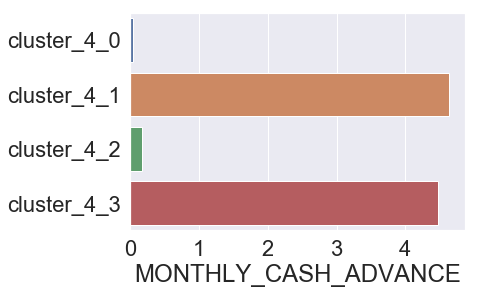

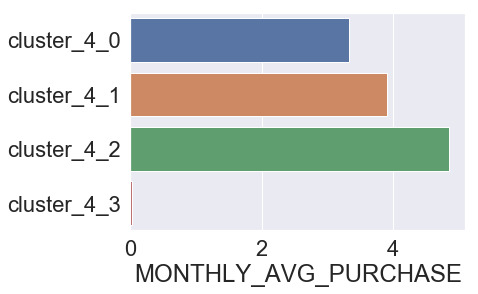

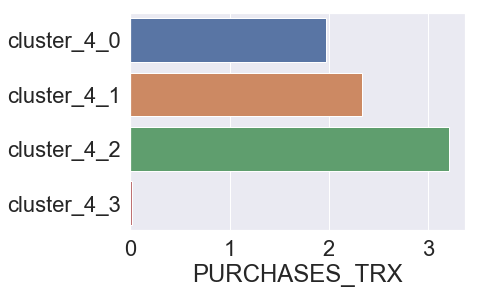

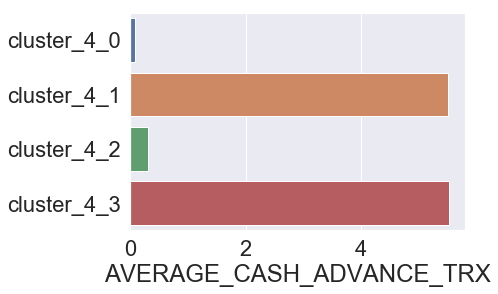

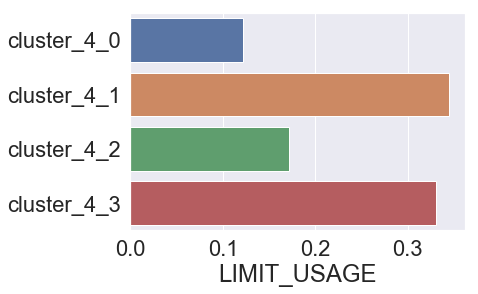

...

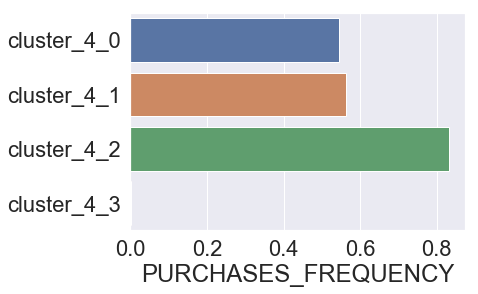

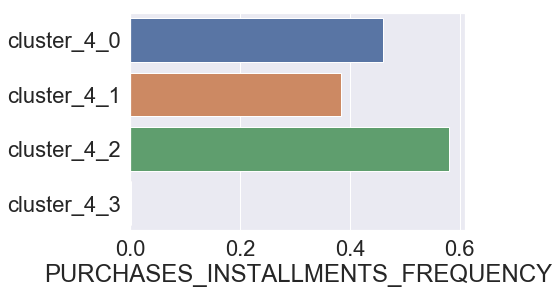

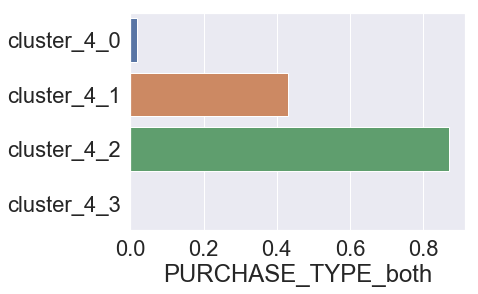

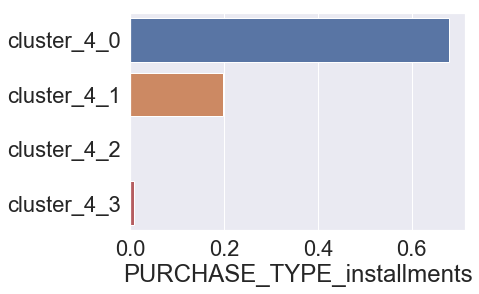

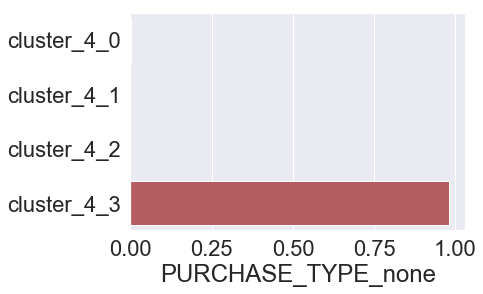

In [81]:
bp = PdfPages('4 segments clustering.pdf')
x_ilocs = range(2,19)
y_ilocs = range(1,5)
for x_iloc in x_ilocs:
    data = profiling_op_final.iloc[x_iloc,y_ilocs]
    fig,axes = plt.subplots(figsize=(6,4))
    sns.barplot(x=data,y=data.index)
    bp.savefig(fig)
bp.close() 

**cluster 0**
- This segment is 24% of total customer base 
    - These customers prefer to take cash advance.
    - Are not interested in purchasing much.
    - Have high balance compared to credit limit
    - Pay less than due amount.
    
**cluster 1**
- This segment is 30% of total customer base 
    - These customers purchase the most.
    - Pay most of the due amount.
    - Prefer both one off and installment purchases.
    
**cluster 2**
- This segment is 21% of total customer base 
    - These customers prefer one off purchases
    - Comparatively less full payment of dues.
    
**cluster 3**
- This segment is 24.4% of total customer base 
    - These customers do not prefer to take cash advance
    - Maintains low balance compared to credit limit.
    - Prefer to clear due balance monthly.
    - Prefer installment purchases.

Insight from New KPIs can be verified from above conclusion

In [82]:
cc_data2.head(2)

,MONTHLY_CASH_ADVANCE,MONTHLY_AVG_PURCHASE,PURCHASES_TRX,AVERAGE_CASH_ADVANCE_TRX,LIMIT_USAGE,ONEOFF_PURCHASES_FREQUENCY,CASH_ADVANCE_TRX,PAY_MIN_PAY,PRC_FULL_PAYMENT,CASH_ADVANCE_FREQUENCY,AVERAGE_PURCHASE_TRX,BALANCE_FREQUENCY,PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,PURCHASE_TYPE_both,PURCHASE_TYPE_installments,PURCHASE_TYPE_none,PURCHASE_TYPE_oneoff,cluster_4,cluster_6
0,0.000000,2.191654,1.098612,0.000000,0.039294,0.0,0.0,0.591254,0.000000,0.000000,47.7,0.818182,0.166667,0.083333,0,1,0,0,0,1
1,6.287695,0.000000,0.000000,7.385067,0.313891,0.0,0.8,0.792799,0.137969,0.162667,0.0,0.909091,0.000000,0.000000,0,0,1,0,3,4


In [83]:
#pairwise relationship of components on the data
sns.pairplot(cc_data2,hue='cluster_4', palette= 'Dark2', diag_kind='kde',height=6)

C:\Users\Shriya\Software\Anaconda2\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Shriya\Software\Anaconda2\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Shriya\Software\Anaconda2\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\Shriya\Software\Anaconda2\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


#### 5.3.2 Cluster count 6

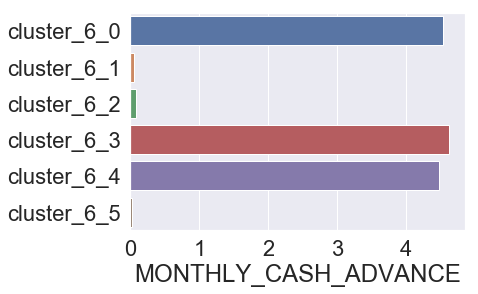

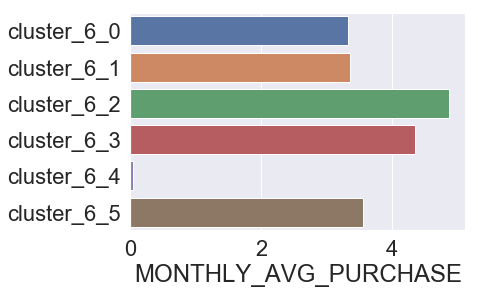

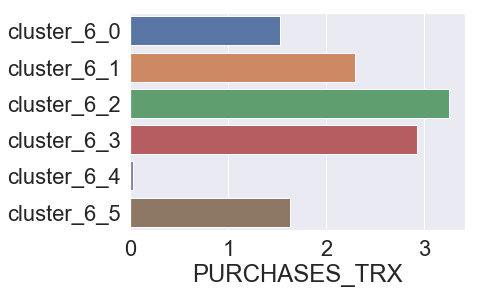

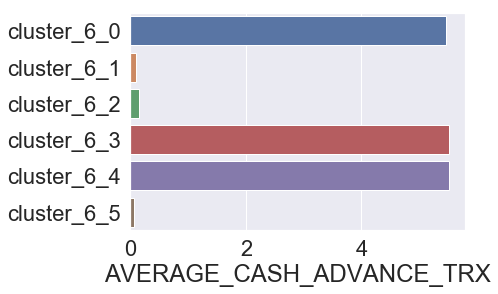

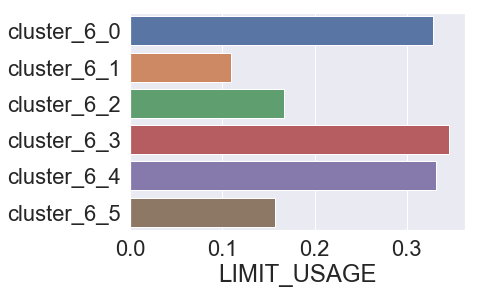

...

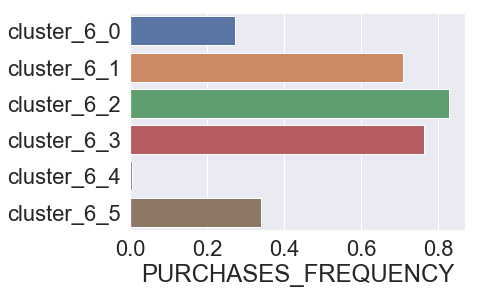

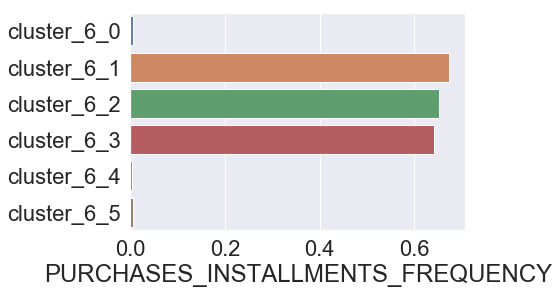

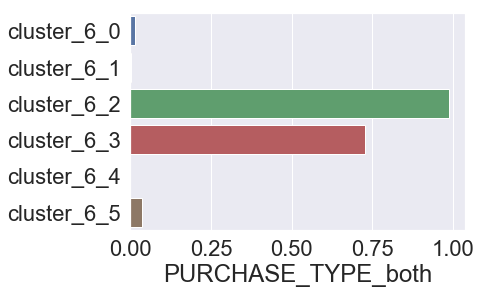

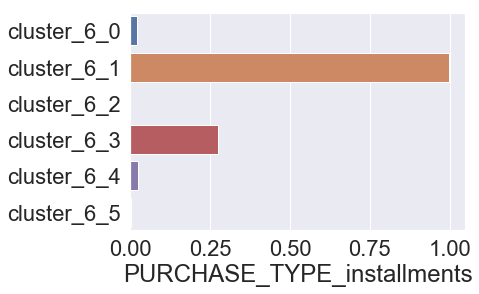

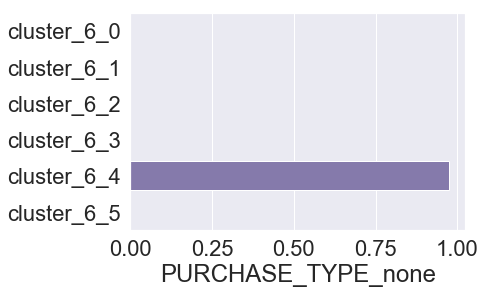

In [84]:
bp = PdfPages('6 segments clustering.pdf')
x_ilocs = range(2,19)
y_ilocs = range(5,11)
for x_iloc in x_ilocs:
    data = profiling_op_final.iloc[x_iloc,y_ilocs]
    fig,axes = plt.subplots(figsize=(6,4))
    sns.barplot(x=data,y=data.index)
    bp.savefig(fig)
bp.close() 

Cluster 0 , Cluster 2 , Cluster 3 are behaving similar<br>
and cluster 1 , Cluster 4 and Cluster 5 are behaving similar<br>
So groups are overlapping

**Hence selecting 4 cluster**

## 6. Marketing Strategy

**Group 0**
- Characterstics:
    - This segment is 24% of total customer base 
    - These customers prefer to take cash advance.
    - Are not interested in purchasing much.
    - Have high balance compared to credit limit
    - Pay less than due amount.
- Strategy :
    - This group takes cash advance and do not clear dues. This group seems to be the most risky group.


**cluster 1**
- Chaeacterstics :
    - This segment is 30% of total customer base 
    - These customers purchase the most.
    - Pay most of the due amount.
    - Prefer both one off and installment purchases.
- Strategy :
    - Since this group purchases the most, giving more offers and rewards would generate more revenue.
    
**cluster 2**
- Characterstics :
    - This segment is 21% of total customer base 
    - These customers prefer one off purchases
    - Comparatively less full payment of dues.
- Strategy :
    - These customers prefer one off purchases could be to pay utility bills. Since full payment of dues is occassional these customers could be encouraged for the same.

    
**cluster 3**
- Characterstics :
    - This segment is 24.4% of total customer base 
    - These customers do not prefer to take cash advance
    - Maintains low balance compared to credit limit.
    - Prefer to clear due balance monthly.
    - Prefer installment purchases.
- Strategy :
    - This group have good customers. But since they don't prefer cash advance, could be encouraged for the same so that interest could generate more revenue.
    